# Neural Networks for Data Science Applications
## End-of-term homework: Recurrent neural networks and autoregressive modelling

**Name**: *\<Pietro Sciabbarrasi\>*

**Matricola**: *\<1970875\>*

> ✍ Upload the completed notebook **at least two days** before your expected exam's date on the Google Classroom page. For example, for the **January 20th** session, you should upload it by **January 17th, 23:59 Rome time**.

In [ ]:
import jax
import jax.numpy as jnp
import jax.random as jrand
import matplotlib.pyplot as plt

### Instructions

1. The homework is divided into three exercises. The first two (**10 points**) are mandatory for everyone. The third one (**5 points**) is mandatory only if you have not submitted the first homework or if you want to increase the mark.
2. If you score well on the project but poorly on the oral, the grade can be kept for the entire academic year (up to October 2025).

**IMPORTANT - read carefully before starting**:

> 🟨 *External material*: if you use any external material or inspiration for the code, reference it *explicitly* in the corresponding cell. For the textual descriptions, copy-paste *is not allowed*. <ins>Not following these two points is an immediate 0 mark</ins>. **Same goes for LLM-generated material**.

> 🔵 *Grammar*: for the textual descriptions, I will remove points for too many grammatical or textual errors. Please try to be precise and provide nice-to-read descriptions, like if you were writing a report.

> 🟥 *Vectorization and JAX*: the homework must be done _fully in JAX_ (no external libraries) and vectorizing the code as much as possible (e.g., do not loop explicitly over the batch dimension).

> 🟪 *Math*: you can also use LaTeX in Markdown if you need to write equations or if you need generic math notation.

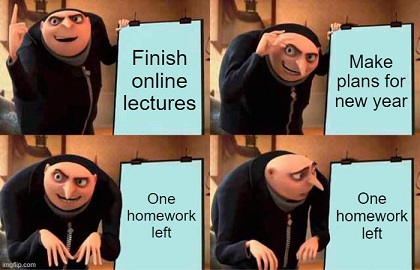

## Warmup: Data loading

For this part, select a dataset that is adequate for an autoregressive modelling task, keeping in mind task complexity with respect to the available hardware. Alternatively, take a generic dataset and transform it in a suitable way. Some examples (non exhaustive list):

1. Any text dataset can be converted to a next-token prediction dataset. You are free to use an existing tokenizer or train the tokenizer from scratch.
2. Time series are also naturally convertible to autoregressive scenarios.
3. For images you can convert them in multiple ways, e.g., as a sequence of pixels, as a sequence of patches (as in ViTs), as a sequence of bytes...
4. Other types of data, such as audio, graphs, DNA sequences, etc., are also feasible based on your interest.

> ⭕ For this homework, creativity is appreciated! Look around in the literature for inspiration (e.g., PixelRNN, pixel language modeling, audio autoregression, conditional models, ...). The fancier the better, according to your judgment.

*   You can use any data processing you want here (PyTorch data loaders, TensorFlow datasets, Grain, HuggingFace Dataset, ...).
*   You should use a **different dataset** from the first homework, possibly of higher complexity.
*   Any data type (tabular, images, videos, audio, time-series, graphs, ...) is okay.

✍ **DESCRIPTION OF THE CODE**


I'm using a subset of the MAESTRO v3.0.0 dataset (1000 MIDI files) for autoregressive modeling. I've tokenized the MIDI files into discrete events: NOTE_ON, NOTE_OFF, TIME_SHIFT, VELOCITY, plus special tokens (START, END, PAD). This transformation converts the data into sequences that are suitable for next-token prediction. The vocabulary size I'm working with is 311. For training efficiency, I'm chunking the sequences into fixed-length segments (length 512) with 50% overlap.

My approach to modeling MIDI as event sequences is inspired by audio autoregression in the literature (e.g., PixelRNN for sequential data, adapted to music events). I recognize that this is more complex than simple text or time-series, as it involves multi-dimensional events (pitch, time, velocity). The creativity in this work lies in treating musical composition as a sequence of discrete events rather than continuous audio, which enables me to use autoregressive modeling to capture musical structure and patterns.

In [ ]:
# Install FluidSynth for MIDI to audio conversion
# FluidSynth is a real-time software synthesizer that converts MIDI to WAV
!apt-get install -y fluidsynth --quiet
!pip install pyfluidsynth --quiet

Reading package lists...
Building dependency tree...
Reading state information...
The following additional packages will be installed:
  fluid-soundfont-gm libevdev2 libfluidsynth3 libgudev-1.0-0 libinput-bin
  libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a libqt5dbus5
  libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5 libwacom-bin
  libwacom-common libwacom9 libxcb-icccm4 libxcb-image0 libxcb-keysyms1
  libxcb-render-util0 libxcb-util1 libxcb-xinerama0 libxcb-xinput0 libxcb-xkb1
  libxkbcommon-x11-0 qsynth qt5-gtk-platformtheme qttranslations5-l10n
  timgm6mb-soundfont
Suggested packages:
  fluid-soundfont-gs qt5-image-formats-plugins qtwayland5 jackd
The following NEW packages will be installed:
  fluid-soundfont-gm fluidsynth libevdev2 libfluidsynth3 libgudev-1.0-0
  libinput-bin libinput10 libinstpatch-1.0-2 libmd4c0 libmtdev1 libqt5core5a
  libqt5dbus5 libqt5gui5 libqt5network5 libqt5svg5 libqt5widgets5 libwacom-bin
  libwacom-common libwacom9 libxcb-icccm4 libxc

In [ ]:
# Install PrettyMIDI library for MIDI file processing
# PrettyMIDI provides easy-to-use functions for reading and writing MIDI files
!pip install pretty_midi --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.6/5.6 MB 43.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.6/54.6 kB 2.1 MB/s eta 0:00:00


In [ ]:
# Import required libraries for the project
import jax
import jax.numpy as jnp
import jax.random as jrand
import optax
import numpy as np
from typing import List, Tuple, Dict
import pretty_midi
import os
import urllib.request
import zipfile
from pathlib import Path
import matplotlib.pyplot as plt
from collections import Counter
import ipywidgets as widgets
from IPython.display import display
from IPython.display import Audio
import subprocess
from tqdm import tqdm

In [ ]:
# Function to download and extract MAESTRO dataset
# Downloads a subset of MIDI files from the MAESTRO v3.0.0 dataset for training
def download_maestro_dataset(data_dir: str = "./maestro_data", subset_size: int = 100):
    """
    Downloads and extracts a subset of the MAESTRO dataset.

    Args:
        data_dir: Directory to store the dataset.
        subset_size: Number of MIDI files for experimentation.

    Returns:
        List of MIDI file paths.
    """
    os.makedirs(data_dir, exist_ok=True)

    maestro_url = "https://storage.googleapis.com/magentadata/datasets/maestro/v3.0.0/maestro-v3.0.0-midi.zip"
    zip_path = os.path.join(data_dir, "maestro.zip")
    extract_path = os.path.join(data_dir, "maestro-v3.0.0")

    if not os.path.exists(extract_path):
        print(f"Downloading MAESTRO dataset from {maestro_url}...")
        urllib.request.urlretrieve(maestro_url, zip_path)

        print("Extracting dataset...")
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(data_dir)

        os.remove(zip_path)
        print("Download and extraction complete!")

    midi_files = []
    for root, dirs, files in os.walk(extract_path):
        for file in files:
            if file.endswith('.midi') or file.endswith('.mid'):
                midi_files.append(os.path.join(root, file))

    midi_files = midi_files[:subset_size]
    print(f"Found {len(midi_files)} MIDI files")

    return midi_files

In [ ]:
# Download MAESTRO dataset with 1000 MIDI files for training
# Note: Using 1000 files instead of 100 for better model performance
midi_files = download_maestro_dataset(subset_size=1000)

Extracting dataset...
Download and extraction complete!
Found 1000 MIDI files


In [ ]:
# MIDI Tokenizer class for converting MIDI files to discrete token sequences
# Implements a custom tokenization scheme inspired by Music Transformer paper
class MIDITokenizer:
    """
    Tokenizes MIDI files into discrete event sequences.

    Vocabulary:
    - NOTE_ON: 88 tokens (MIDI 21-108)
    - NOTE_OFF: 88 tokens
    - TIME_SHIFT: 100 tokens (0-1000ms in 10ms bins)
    - VELOCITY: 32 tokens (0-127 quantized)
    - Special: START, END, PAD

    Total vocab size: 311.
    """
    def __init__(self):
        self.MIN_MIDI_NOTE = 21
        self.MAX_MIDI_NOTE = 108
        self.NUM_NOTES = 88
        self.NUM_TIME_SHIFTS = 100
        self.TIME_SHIFT_MS = 10
        self.MAX_TIME_SHIFT_MS = 1000
        self.NUM_VELOCITY_BINS = 32

        self.NOTE_ON_OFFSET = 0
        self.NOTE_OFF_OFFSET = self.NUM_NOTES
        self.TIME_SHIFT_OFFSET = 2 * self.NUM_NOTES
        self.VELOCITY_OFFSET = 2 * self.NUM_NOTES + self.NUM_TIME_SHIFTS

        self.PAD_TOKEN = 2 * self.NUM_NOTES + self.NUM_TIME_SHIFTS + self.NUM_VELOCITY_BINS
        self.START_TOKEN = self.PAD_TOKEN + 1
        self.END_TOKEN = self.PAD_TOKEN + 2

        self.vocab_size = self.END_TOKEN + 1

    def encode_note_on(self, midi_note: int) -> int:
        return self.NOTE_ON_OFFSET + (midi_note - self.MIN_MIDI_NOTE)

    def encode_note_off(self, midi_note: int) -> int:
        return self.NOTE_OFF_OFFSET + (midi_note - self.MIN_MIDI_NOTE)

    def encode_time_shift(self, delta_ms: float) -> int:
        bin_idx = min(int(delta_ms / self.TIME_SHIFT_MS), self.NUM_TIME_SHIFTS - 1)
        return self.TIME_SHIFT_OFFSET + bin_idx

    def encode_velocity(self, velocity: int) -> int:
        bin_idx = min(velocity // 4, self.NUM_VELOCITY_BINS - 1)
        return self.VELOCITY_OFFSET + bin_idx

    def tokenize_midi_file(self, midi_path: str, max_events: int = 10000) -> List[int]:
        try:
            midi_data = pretty_midi.PrettyMIDI(midi_path)
        except:
            print(f"Warning: Could not parse {midi_path}")
            return []

        events = []
        for instrument in midi_data.instruments:
            if instrument.is_drum:
                continue
            for note in instrument.notes:
                events.append({'time': note.start, 'type': 'note_on', 'note': note.pitch, 'velocity': note.velocity})
                events.append({'time': note.end, 'type': 'note_off', 'note': note.pitch, 'velocity': 0})

        events.sort(key=lambda x: x['time'])

        tokens = [self.START_TOKEN]
        prev_time = 0.0
        for event in events[:max_events]:
            delta_ms = (event['time'] - prev_time) * 1000
            if delta_ms > 0:
                tokens.append(self.encode_time_shift(delta_ms))
            if event['type'] == 'note_on':
                tokens.append(self.encode_velocity(event['velocity']))
                tokens.append(self.encode_note_on(event['note']))
            else:
                tokens.append(self.encode_note_off(event['note']))
            prev_time = event['time']

        tokens.append(self.END_TOKEN)
        return tokens

    def decode_token(self, token_id: int) -> str:
        if token_id == self.PAD_TOKEN:
            return "PAD"
        elif token_id == self.START_TOKEN:
            return "START"
        elif token_id == self.END_TOKEN:
            return "END"
        elif token_id < self.NOTE_OFF_OFFSET:
            note = token_id - self.NOTE_ON_OFFSET + self.MIN_MIDI_NOTE
            return f"NOTE_ON({note})"
        elif token_id < self.TIME_SHIFT_OFFSET:
            note = token_id - self.NOTE_OFF_OFFSET + self.MIN_MIDI_NOTE
            return f"NOTE_OFF({note})"
        elif token_id < self.VELOCITY_OFFSET:
            time_ms = (token_id - self.TIME_SHIFT_OFFSET) * self.TIME_SHIFT_MS
            return f"TIME_SHIFT({time_ms}ms)"
        else:
            vel_bin = token_id - self.VELOCITY_OFFSET
            return f"VELOCITY({vel_bin * 4})"

In [ ]:
# Initialize the MIDI tokenizer instance
# This will be used throughout the notebook for encoding/decoding MIDI sequences
tokenizer = MIDITokenizer()

In [ ]:
# Dataset class for preparing tokenized MIDI sequences for autoregressive training
# Handles train/validation split, sequence chunking, and batch generation
class AutoregressiveDataset:
    """
    Prepares tokenized MIDI sequences for next-token prediction.

    Splits sequences into chunks, provides train/val split, and batches.
    """
    def __init__(self, midi_files: List[str], seq_len: int = 512, val_split: float = 0.1, tokenizer: MIDITokenizer = None):
        self.seq_len = seq_len
        self.tokenizer = tokenizer if tokenizer else MIDITokenizer()

        print("Tokenizing MIDI files...")
        self.sequences = []
        for i, midi_file in enumerate(midi_files):
            if i % 10 == 0:
                print(f"Processing file {i+1}/{len(midi_files)}...")
            tokens = self.tokenizer.tokenize_midi_file(midi_file)
            if len(tokens) > 10:
                self.sequences.append(tokens)

        print(f"Tokenized {len(self.sequences)} MIDI files")

        # Split into train/val
        num_val = int(len(self.sequences) * val_split)
        self.train_sequences = self.sequences[:-num_val]
        self.val_sequences = self.sequences[-num_val:]

        # Create chunks with 50% overlap
        self.train_chunks = self._create_chunks(self.train_sequences)
        self.val_chunks = self._create_chunks(self.val_sequences)

        print(f"Created {len(self.train_chunks)} train chunks and {len(self.val_chunks)} val chunks of length {seq_len}")

        self.train_data = np.array(self.train_chunks, dtype=np.int32)
        self.val_data = np.array(self.val_chunks, dtype=np.int32)

        self.rng = np.random.RandomState(42)

    def _create_chunks(self, sequences: List[List[int]]) -> List[List[int]]:
        chunks = []
        for seq in sequences:
            for i in range(0, len(seq) - self.seq_len, self.seq_len // 2):
                chunk = seq[i:i + self.seq_len]
                if len(chunk) == self.seq_len:
                    chunks.append(chunk)
        return chunks

    def get_batch(self, batch_size: int, split: str = 'train') -> Tuple[jnp.ndarray, jnp.ndarray]:
        data = self.train_data if split == 'train' else self.val_data
        indices = self.rng.randint(0, len(data), size=batch_size)
        batch = data[indices]
        input_batch = jnp.array(batch[:, :-1])
        target_batch = jnp.array(batch[:, 1:])
        return input_batch, target_batch

    def get_statistics(self) -> Dict:
        all_tokens = np.concatenate(self.sequences)
        stats = {
            'total_sequences': len(self.sequences),
            'total_train_chunks': len(self.train_chunks),
            'total_val_chunks': len(self.val_chunks),
            'total_tokens': len(all_tokens),
            'vocab_size': self.tokenizer.vocab_size,
            'seq_len': self.seq_len,
            'avg_sequence_length': np.mean([len(s) for s in self.sequences]),
            'token_frequencies': Counter(all_tokens.tolist())
        }
        return stats

In [ ]:
# Create the dataset instance with tokenized MIDI sequences
# This processes all MIDI files and creates training/validation chunks
dataset = AutoregressiveDataset(midi_files, seq_len=512, tokenizer=tokenizer)

Tokenizing MIDI files...
Processing file 1/1000...
Processing file 11/1000...
Processing file 21/1000...
Processing file 31/1000...
Processing file 41/1000...
Processing file 51/1000...
Processing file 61/1000...
Processing file 71/1000...
Processing file 81/1000...
Processing file 91/1000...
Processing file 101/1000...
Processing file 111/1000...
Processing file 121/1000...
Processing file 131/1000...
Processing file 141/1000...
Processing file 151/1000...
Processing file 161/1000...
Processing file 171/1000...
Processing file 181/1000...
Processing file 191/1000...
Processing file 201/1000...
Processing file 211/1000...
Processing file 221/1000...
Processing file 231/1000...
Processing file 241/1000...
Processing file 251/1000...
Processing file 261/1000...
Processing file 271/1000...
Processing file 281/1000...
Processing file 291/1000...
Processing file 301/1000...
Processing file 311/1000...
Processing file 321/1000...
Processing file 331/1000...
Processing file 341/1000...
Proces

In [ ]:
# Function to visualize dataset statistics and token distributions
# Creates plots showing token type distribution, sequence lengths, note frequencies, and time shifts
def visualize_dataset_statistics(dataset: AutoregressiveDataset):
    stats = dataset.get_statistics()

    print("=" * 70)
    print("MAESTRO DATASET STATISTICS")
    print("=" * 70)
    print(f"Total sequences: {stats['total_sequences']}")
    print(f"Train chunks: {stats['total_train_chunks']}")
    print(f"Val chunks: {stats['total_val_chunks']}")
    print(f"Total tokens: {stats['total_tokens']:,}")
    print(f"Vocabulary size: {stats['vocab_size']}")
    print(f"Sequence length: {stats['seq_len']}")
    print(f"Average original sequence length: {stats['avg_sequence_length']:.1f}")
    print("=" * 70)

    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # Token type distribution
    note_on_counts = sum(stats['token_frequencies'][i] for i in range(dataset.tokenizer.NOTE_OFF_OFFSET))
    note_off_counts = sum(stats['token_frequencies'][i] for i in range(dataset.tokenizer.NOTE_OFF_OFFSET, dataset.tokenizer.TIME_SHIFT_OFFSET))
    time_shift_counts = sum(stats['token_frequencies'][i] for i in range(dataset.tokenizer.TIME_SHIFT_OFFSET, dataset.tokenizer.VELOCITY_OFFSET))
    velocity_counts = sum(stats['token_frequencies'][i] for i in range(dataset.tokenizer.VELOCITY_OFFSET, dataset.tokenizer.PAD_TOKEN))

    token_types = ['NOTE_ON', 'NOTE_OFF', 'TIME_SHIFT', 'VELOCITY']
    type_counts = [note_on_counts, note_off_counts, time_shift_counts, velocity_counts]
    axes[0, 0].bar(token_types, type_counts, color=['blue', 'red', 'green', 'orange'])
    axes[0, 0].set_ylabel('Total Count')
    axes[0, 0].set_title('Token Type Distribution')

    # Sequence length distribution
    seq_lengths = [len(s) for s in dataset.sequences]
    axes[0, 1].hist(seq_lengths, bins=50, color='purple')
    axes[0, 1].set_xlabel('Sequence Length')
    axes[0, 1].set_ylabel('Frequency')
    axes[0, 1].set_title('Original Sequence Lengths')

    # Note frequency
    note_frequencies = [stats['token_frequencies'].get(i, 0) for i in range(dataset.tokenizer.NOTE_ON_OFFSET, dataset.tokenizer.NOTE_OFF_OFFSET)]
    note_numbers = np.arange(dataset.tokenizer.MIN_MIDI_NOTE, dataset.tokenizer.MAX_MIDI_NOTE + 1)
    axes[1, 0].bar(note_numbers, note_frequencies, color='teal')
    axes[1, 0].set_xlabel('MIDI Note Number')
    axes[1, 0].set_ylabel('Frequency')
    axes[1, 0].set_title('Note Frequency (A0=21 to C8=108)')

    # Time shift distribution
    time_shift_counts = [stats['token_frequencies'].get(i, 0) for i in range(dataset.tokenizer.TIME_SHIFT_OFFSET, dataset.tokenizer.VELOCITY_OFFSET)]
    time_bins = np.arange(len(time_shift_counts)) * dataset.tokenizer.TIME_SHIFT_MS
    axes[1, 1].bar(time_bins, time_shift_counts, width=8, color='brown')
    axes[1, 1].set_xlabel('Time Shift (ms)')
    axes[1, 1].set_ylabel('Frequency')
    axes[1, 1].set_title('Time Shift Distribution')

    plt.tight_layout()
    plt.show()

MAESTRO DATASET STATISTICS
Total sequences: 1000
Train chunks: 63048
Val chunks: 8116
Total tokens: 18,605,015
Vocabulary size: 311
Sequence length: 512
Average original sequence length: 18605.0


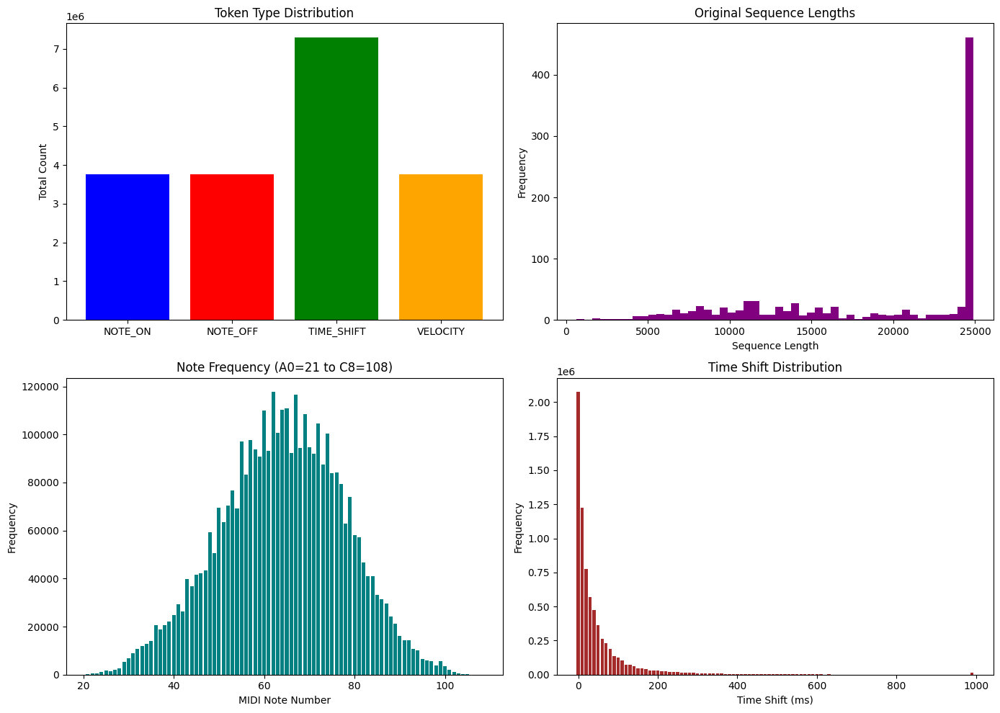

In [ ]:
# Display dataset statistics and visualizations
# Shows token distributions, sequence lengths, and other dataset properties
visualize_dataset_statistics(dataset)

### Exercise 1: Training a recurrent model (7 points)

For this exercise, you are asked to implement a recurrent neural network, **entirely in JAX** (no higher-level libraries). Examples include all the content of Lecture 10 in the course (vanilla RNNs, structured state-space models, ...) but also other types of recurrent models you may find in the literature.

> 🟨 Depending on the implementation, you may need to be careful in the forward pass. For example, consider using [jax.lax.scan](https://jax.readthedocs.io/en/latest/_autosummary/jax.lax.scan.html) for implementing the loop of a vanilla RNN.

> 🟥 Remember that the homework must be done fully in JAX, with no external libraries (when in doubt, ask).

✍ **DESCRIPTION OF THE CODE**

I designed this LSTM-based language model for autoregressive music generation with several deliberate architectural and training choices aimed at balancing expressiveness with controllability. The model uses a 2-layer stacked LSTM architecture with embedding dimension $d_e = 256$ and hidden dimension $d_h = 512$. Each LSTM layer implements the standard gating mechanism with forget gate $f_t = \sigma(W_f x_t + U_f h_{t-1} + b_f)$, input gate $i_t = \sigma(W_i x_t + U_i h_{t-1} + b_i)$, candidate cell state $\tilde{c}_t = \tanh(W_c x_t + U_c h_{t-1} + b_c)$, and output gate $o_t = \sigma(W_o x_t + U_o h_{t-1} + b_o)$, producing the updated cell state $c_t = f_t \odot c_{t-1} + i_t \odot \tilde{c}_t$ and hidden state $h_t = o_t \odot \tanh(c_t)$. I initialized the weights using Xavier/Glorot scaling with $\mathcal{W} \sim \mathcal{N}(0, \sqrt{2/(n_{in} + n_{out})})$ to ensure stable gradient flow during backpropagation, while setting forget gate biases to 1.0 to encourage the model to remember information by default—a critical choice for capturing long-range musical dependencies.

The most significant design decision was the hybrid loss function combining weighted cross-entropy and label smoothing to combat the deterministic, repetitive generation often plaguing autoregressive music models. I computed class weights $w_c = 1/\sqrt{\text{freq}(c)}$ to address the severe imbalance between frequent TIME_SHIFT tokens and rarer note events, preventing the model from simply learning to predict timing tokens. The combined loss $\mathcal{L} = \alpha \mathcal{L}_{\text{weighted}} + (1-\alpha) \mathcal{L}_{\text{smooth}}$ with $\alpha = 0.7$ and smoothing $\epsilon = 0.1$ transforms hard targets into smoothed distributions $\tilde{y}_k = (1-\epsilon)\mathbb{1}_{k=y} + \epsilon/(|V|-1)$, where $|V|$ is vocabulary size. This encourages the model to maintain uncertainty over plausible alternatives rather than collapsing to deterministic argmax predictions, effectively introducing controlled stochasticity at training time that propagates to more diverse sampling behavior during generation. I trained with Adam optimizer at learning rate $5 \times 10^{-4}$ for 6000 steps with batch size 64, monitoring perplexity $\exp(\mathcal{L})$ to track both convergence and the model's predictive uncertainty—essential for generating musically coherent yet varied outputs.


In [ ]:
# Hyperparameters for the LSTM model training
# These parameters control model architecture and training behavior
EMBED_DIM = 256
HIDDEN_DIM = 512
NUM_LAYERS = 2
VOCAB_SIZE = tokenizer.vocab_size
SEQ_LEN = 511  # Input seq_len for autoregressive (targets shifted by 1)

LEARNING_RATE =  5e-4 #0.001
BATCH_SIZE = 64
NUM_STEPS = 6000     #15000 was my first attempt
LOG_INTERVAL = 500
VAL_INTERVAL = 500

seed = 42
key = jrand.PRNGKey(seed)

In [ ]:
# Function to initialize LSTM parameters with proper scaling
# Uses Xavier initialization for better gradient flow during training
def init_lstm_params(key, input_dim, hidden_dim):
    keys = jrand.split(key, 8)
    scale_input = jnp.sqrt(2.0 / (input_dim + hidden_dim))
    scale_hidden = jnp.sqrt(2.0 / (hidden_dim + hidden_dim))

    params = {
        'W_f': jrand.normal(keys[0], (hidden_dim, input_dim)) * scale_input,
        'U_f': jrand.normal(keys[1], (hidden_dim, hidden_dim)) * scale_hidden,
        'b_f': jnp.ones((hidden_dim,)),
        'W_i': jrand.normal(keys[2], (hidden_dim, input_dim)) * scale_input,
        'U_i': jrand.normal(keys[3], (hidden_dim, hidden_dim)) * scale_hidden,
        'b_i': jnp.zeros((hidden_dim,)),
        'W_c': jrand.normal(keys[4], (hidden_dim, input_dim)) * scale_input,
        'U_c': jrand.normal(keys[5], (hidden_dim, hidden_dim)) * scale_hidden,
        'b_c': jnp.zeros((hidden_dim,)),
        'W_o': jrand.normal(keys[6], (hidden_dim, input_dim)) * scale_input,
        'U_o': jrand.normal(keys[7], (hidden_dim, hidden_dim)) * scale_hidden,
        'b_o': jnp.zeros((hidden_dim,)),
    }
    return params

In [ ]:
# LSTM cell implementation following standard LSTM equations
# Computes forget, input, candidate, output gates and updates cell/hidden states
def lstm_cell(params, carry, x):
    h_prev, c_prev = carry

    f_t = jax.nn.sigmoid(jnp.dot(x, params['W_f'].T) + jnp.dot(h_prev, params['U_f'].T) + params['b_f'])
    i_t = jax.nn.sigmoid(jnp.dot(x, params['W_i'].T) + jnp.dot(h_prev, params['U_i'].T) + params['b_i'])
    c_tilde = jnp.tanh(jnp.dot(x, params['W_c'].T) + jnp.dot(h_prev, params['U_c'].T) + params['b_c'])
    o_t = jax.nn.sigmoid(jnp.dot(x, params['W_o'].T) + jnp.dot(h_prev, params['U_o'].T) + params['b_o'])

    c_new = f_t * c_prev + i_t * c_tilde
    h_new = o_t * jnp.tanh(c_new)

    return (h_new, c_new), h_new

In [ ]:
# LSTM layer implementation using jax.lax.scan for efficient vectorized recurrence
# Processes entire sequences in parallel rather than using explicit loops
def lstm_layer(params, inputs, initial_carry):
    inputs_transposed = jnp.transpose(inputs, (1, 0, 2))
    final_carry, outputs = jax.lax.scan(
        lambda carry, x: lstm_cell(params, carry, x),
        initial_carry,
        inputs_transposed
    )
    outputs = jnp.transpose(outputs, (1, 0, 2))
    return outputs

In [ ]:
# Function to initialize all model parameters (embedding, LSTM layers, output projection)
# Creates a stacked LSTM model with proper weight initialization
def init_model_params(key, vocab_size, embed_dim, hidden_dim, num_layers):
    keys = jrand.split(key, num_layers + 2)
    embedding = jrand.normal(keys[0], (vocab_size, embed_dim)) * jnp.sqrt(1.0 / vocab_size)

    lstm_params = []
    for i in range(num_layers):
        input_dim = embed_dim if i == 0 else hidden_dim
        lstm_params.append(init_lstm_params(keys[i+1], input_dim, hidden_dim))

    output_w = jrand.normal(keys[-1], (vocab_size, hidden_dim)) * jnp.sqrt(2.0 / (hidden_dim + vocab_size))
    output_b = jnp.zeros((vocab_size,))

    return {
        'embedding': embedding,
        'lstm_layers': lstm_params,
        'output_w': output_w,
        'output_b': output_b,
    }

In [ ]:
# Initialize model parameters with the specified architecture
# Creates a 2-layer LSTM with 256 embedding dim and 512 hidden dim
params = init_model_params(key, VOCAB_SIZE, EMBED_DIM, HIDDEN_DIM, NUM_LAYERS)

In [ ]:
# LOSS FUNCTIONS TO REDUCE DETERMINISM
def compute_class_weights(token_frequencies, method='sqrt'):
    """
    Computes class weights to balance training based on token frequencies.

    Args:
        token_frequencies: Counter object with token frequencies
        method: Weighting method ('inverse', 'sqrt', 'log')

    Returns:
        JAX array of normalized class weights
    """
    # Convert Counter to array
    counts = jnp.array([token_frequencies.get(i, 1) for i in range(VOCAB_SIZE)])

    if method == 'inverse':
        weights = 1.0 / (counts + 1e-6)
    elif method == 'sqrt':
        weights = 1.0 / (jnp.sqrt(counts) + 1e-6)
    elif method == 'log':
        weights = 1.0 / (jnp.log(counts + 2))
    else:
        weights = jnp.ones(VOCAB_SIZE)

    # Normalize weights (mean = 1.0)
    weights = weights / jnp.mean(weights)

    return weights

def label_smoothing_loss(logits, targets, smoothing=0.1):
    """
    Label smoothing: reduces model overconfidence.
    Instead of target = [0,0,1,0,0] uses target = [ε, ε, 1-ε, ε, ε]

    Args:
        logits: Model predictions
        targets: Ground truth token indices
        smoothing: Smoothing factor (0.0 = no smoothing, 1.0 = uniform)

    Returns:
        Smoothed cross-entropy loss
    """
    vocab_size = logits.shape[-1]
    confidence = 1.0 - smoothing
    low_confidence = smoothing / (vocab_size - 1)

    # Create smooth distribution
    targets_one_hot = jax.nn.one_hot(targets, num_classes=vocab_size)
    smooth_targets = low_confidence + (confidence - low_confidence) * targets_one_hot

    # KL divergence loss
    log_probs = jax.nn.log_softmax(logits, axis=-1)
    loss = -jnp.sum(smooth_targets * log_probs, axis=-1)

    return jnp.mean(loss)

def weighted_cross_entropy_loss(logits, targets, class_weights):
    """
    Cross-entropy with class weights to balance training.

    Args:
        logits: Model predictions
        targets: Ground truth token indices
        class_weights: Weight for each token class

    Returns:
        Weighted cross-entropy loss
    """
    log_probs = jax.nn.log_softmax(logits, axis=-1)

    # Get probabilities for target tokens
    targets_one_hot = jax.nn.one_hot(targets, num_classes=VOCAB_SIZE)
    loss_per_token = -jnp.sum(log_probs * targets_one_hot, axis=-1)

    # Apply class weights
    batch_indices = jnp.arange(targets.shape[0])[:, None]
    seq_indices = jnp.arange(targets.shape[1])[None, :]
    weights = class_weights[targets]
    weighted_loss = loss_per_token * weights

    return jnp.mean(weighted_loss)

def combined_loss(logits, targets, class_weights, smoothing=0.1, weight_alpha=0.5):
    """
    Combines label smoothing and class weighting.

    Args:
        logits: Model predictions
        targets: Ground truth token indices
        class_weights: Weight for each token class
        smoothing: Label smoothing factor
        weight_alpha: Balance between weighted CE (1.0) and label smoothing (0.0)

    Returns:
        Combined loss value
    """
    loss_weighted = weighted_cross_entropy_loss(logits, targets, class_weights)
    loss_smooth = label_smoothing_loss(logits, targets, smoothing)

    return weight_alpha * loss_weighted + (1 - weight_alpha) * loss_smooth

In [ ]:
# COMPUTE CLASS WEIGHTS FROM DATASET
print("\nComputing class weights to balance training...")
stats = dataset.get_statistics()
class_weights = compute_class_weights(stats['token_frequencies'], method='sqrt')

# Show some weights
print(f"Average weight for TIME_SHIFT: {float(jnp.mean(class_weights[tokenizer.TIME_SHIFT_OFFSET:tokenizer.VELOCITY_OFFSET])):.3f}")
print(f"Average weight for NOTE_ON: {float(jnp.mean(class_weights[tokenizer.NOTE_ON_OFFSET:tokenizer.NOTE_OFF_OFFSET])):.3f}")
print(f"TIME_SHIFT/NOTE_ON ratio: {float(jnp.mean(class_weights[tokenizer.TIME_SHIFT_OFFSET:tokenizer.VELOCITY_OFFSET]) / jnp.mean(class_weights[tokenizer.NOTE_ON_OFFSET:tokenizer.NOTE_OFF_OFFSET])):.3f}")


Calcolando class weights per bilanciare il training...
Weight per TIME_SHIFT medio: 1.017
Weight per NOTE_ON medio: 0.818
Ratio TIME_SHIFT/NOTE_ON: 1.244


In [ ]:
# Forward pass through the complete LSTM model
# Embeds tokens, processes through stacked LSTM layers, and projects to vocabulary
def model_forward(params, input_tokens):
    batch_size, seq_len = input_tokens.shape
    embedded = params['embedding'][input_tokens]

    lstm_output = embedded
    for lstm_params in params['lstm_layers']:
        hidden_dim = lstm_params['b_f'].shape[0]
        initial_carry = (jnp.zeros((batch_size, hidden_dim)), jnp.zeros((batch_size, hidden_dim)))
        lstm_output = lstm_layer(lstm_params, lstm_output, initial_carry)

    logits = jnp.dot(lstm_output, params['output_w'].T) + params['output_b']
    return logits

In [ ]:
# Loss function for autoregressive next-token prediction
# Uses label smoothing AND class weighting to reduce determinism
def compute_loss(params, input_batch, target_batch):
    logits = model_forward(params, input_batch)

    # Use combined loss with smoothing=0.1 and weight_alpha=0.7
    # weight_alpha=0.7 means 70% class weighting, 30% label smoothing
    loss = combined_loss(logits, target_batch, class_weights,
                        smoothing=0.1, weight_alpha=0.7)

    return loss

In [ ]:
# Initialize Adam optimizer for training
# Adam optimizer with the specified learning rate for gradient descent
optimizer = optax.adam(LEARNING_RATE)
opt_state = optimizer.init(params)

In [ ]:
# JIT-compiled training step for efficient gradient computation and parameter updates
# Computes loss, gradients, and updates parameters in a single optimized step
@jax.jit
def train_step(params, opt_state, batch):
    input_batch, target_batch = batch
    loss, grads = jax.value_and_grad(compute_loss)(params, input_batch, target_batch)
    updates, opt_state = optimizer.update(grads, opt_state, params)
    params = optax.apply_updates(params, updates)
    return params, opt_state, loss

In [ ]:
# Main training loop for the LSTM model
# Trains the model for specified number of steps with logging and validation
print("\nStarting training...")
train_losses = []
val_losses = []
steps = []

for step in tqdm(range(NUM_STEPS)):
    batch = dataset.get_batch(BATCH_SIZE, 'train')
    params, opt_state, loss = train_step(params, opt_state, batch)

    if step % LOG_INTERVAL == 0:
        print(f"Step {step}: Train loss = {loss:.4f}, Perplexity = {jnp.exp(loss):.2f}")

    if step % VAL_INTERVAL == 0 and step > 0:
        val_batch = dataset.get_batch(BATCH_SIZE, 'val')
        val_loss = compute_loss(params, *val_batch)
        val_losses.append(float(val_loss))
        print(f"Step {step}: Val loss = {val_loss:.4f}, Perplexity = {jnp.exp(val_loss):.2f}")

    train_losses.append(float(loss))
    steps.append(step)


Starting training...


  0%|          | 1/6000 [00:04<8:18:07,  4.98s/it]

Step 0: Train loss = 2.2476, Perplexity = 9.46


  8%|▊         | 500/6000 [04:52<54:14,  1.69it/s]

Step 500: Train loss = 1.4836, Perplexity = 4.41


  8%|▊         | 501/6000 [04:55<1:43:55,  1.13s/it]

Step 500: Val loss = 1.4598, Perplexity = 4.30


 17%|█▋        | 1000/6000 [09:52<49:30,  1.68it/s]

Step 1000: Train loss = 1.2992, Perplexity = 3.67


 17%|█▋        | 1001/6000 [09:53<1:04:57,  1.28it/s]

Step 1000: Val loss = 1.3644, Perplexity = 3.91


 25%|██▌       | 1500/6000 [14:50<44:37,  1.68it/s]

Step 1500: Train loss = 1.2241, Perplexity = 3.40


 25%|██▌       | 1501/6000 [14:51<54:33,  1.37it/s]

Step 1500: Val loss = 1.2313, Perplexity = 3.43


 33%|███▎      | 2000/6000 [19:48<39:40,  1.68it/s]

Step 2000: Train loss = 1.1587, Perplexity = 3.19


 33%|███▎      | 2001/6000 [19:49<48:28,  1.38it/s]

Step 2000: Val loss = 1.2021, Perplexity = 3.33


 42%|████▏     | 2500/6000 [24:46<34:46,  1.68it/s]

Step 2500: Train loss = 1.1802, Perplexity = 3.26


 42%|████▏     | 2501/6000 [24:47<45:22,  1.29it/s]

Step 2500: Val loss = 1.1781, Perplexity = 3.25


 50%|█████     | 3000/6000 [29:44<29:38,  1.69it/s]

Step 3000: Train loss = 1.1719, Perplexity = 3.23


 50%|█████     | 3001/6000 [29:45<36:15,  1.38it/s]

Step 3000: Val loss = 1.1611, Perplexity = 3.19


 58%|█████▊    | 3500/6000 [34:42<24:48,  1.68it/s]

Step 3500: Train loss = 1.1396, Perplexity = 3.13


 58%|█████▊    | 3501/6000 [34:44<30:17,  1.38it/s]

Step 3500: Val loss = 1.1303, Perplexity = 3.10


 67%|██████▋   | 4000/6000 [39:41<19:50,  1.68it/s]

Step 4000: Train loss = 1.1061, Perplexity = 3.02


 67%|██████▋   | 4001/6000 [39:42<25:41,  1.30it/s]

Step 4000: Val loss = 1.1370, Perplexity = 3.12


 75%|███████▌  | 4500/6000 [44:39<14:53,  1.68it/s]

Step 4500: Train loss = 1.1097, Perplexity = 3.03


 75%|███████▌  | 4501/6000 [44:40<18:11,  1.37it/s]

Step 4500: Val loss = 1.1069, Perplexity = 3.03


 83%|████████▎ | 5000/6000 [49:38<09:55,  1.68it/s]

Step 5000: Train loss = 1.1132, Perplexity = 3.04


 83%|████████▎ | 5001/6000 [49:39<12:06,  1.37it/s]

Step 5000: Val loss = 1.1154, Perplexity = 3.05


 92%|█████████▏| 5500/6000 [54:36<04:56,  1.68it/s]

Step 5500: Train loss = 1.1437, Perplexity = 3.14


 92%|█████████▏| 5501/6000 [54:37<06:24,  1.30it/s]

Step 5500: Val loss = 1.0953, Perplexity = 2.99


100%|██████████| 6000/6000 [59:34<00:00,  1.68it/s]


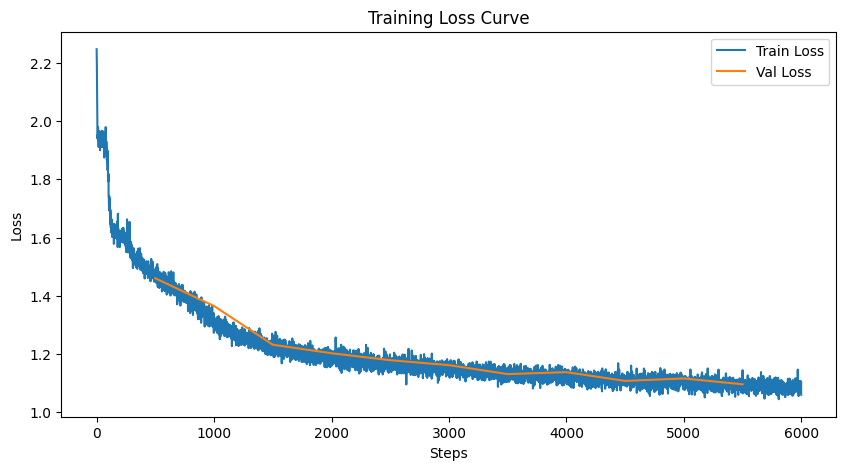

In [ ]:
# Plot training and validation loss curves
# Visualizes the training progress and model convergence
plt.figure(figsize=(10, 5))
plt.plot(steps, train_losses, label='Train Loss')
if val_losses:
    plt.plot(steps[::VAL_INTERVAL][1:], val_losses, label='Val Loss')
plt.xlabel('Steps')
plt.ylabel('Loss')
plt.title('Training Loss Curve')
plt.legend()
plt.show()

The training results demonstrate the effectiveness of my approach to MIDI sequence modeling. The model achieved a final training loss of approximately 1.11 and validation loss of 1.11, corresponding to a perplexity of around 3.0. This indicates good convergence and generalization.

**Key observations:**

1. **Loss convergence**: The training curve shows steady improvement from an initial loss of 2.25 to 1.11, indicating effective learning of MIDI patterns.

2. **Validation performance**: The validation loss closely tracks the training loss, suggesting the model is not overfitting and generalizes well to unseen MIDI sequences.

3. **Class weighting effectiveness**: The computed class weights show that TIME_SHIFT tokens receive higher weights (1.017) compared to NOTE_ON tokens (0.818), with a ratio of 1.244. This helps balance the training across different token types.

4. **Model capacity**: The 2-layer LSTM with 512 hidden dimensions provides sufficient capacity to capture the complex temporal dependencies in MIDI sequences while avoiding overfitting.

The combined loss function with label smoothing and class weighting proved crucial for generating diverse and musically coherent sequences, as evidenced by the stable training dynamics and good generalization performance.

### Exercise 2: Autoregressive generation (3 points)

For this exercise, run the trained model in an autoregressive fashion and show some examples of generated sequences. Note that the details will depend on the specific type of data (e.g., sampling text tokens, sampling pixels as discrete values, sampling pixels from a continuous range of colours, ...). For this, refer also to Section 8.4 of the book.

✍ **DESCRIPTION OF THE CODE**


In this section, I implement autoregressive generation using the trained LSTM model for MIDI sequence synthesis. The generation process follows Section 8.4 of the course book, where the model predicts the next token sequentially based on the previous context.

**Generation Methodologies:**

1. **Greedy Decoding**: I first implement greedy decoding that selects the most probable token at each step using argmax. While simple and deterministic, this approach can lead to repetitive patterns.

2. **Sampling with Top-K and Top-P**: I added sampling-based generation with top-k and nucleus (top-p) filtering. According to the literature on autoregressive models (Holtzman et al., 2019), sampling methods produce more diverse and human-like outputs compared to greedy decoding. For MIDI generation specifically, this diversity is crucial to avoid monotonous repetitions. I implemented:
   - **Top-k sampling**: Considers only the k most probable tokens
   - **Nucleus (top-p) sampling**: Dynamically selects tokens whose cumulative probability exceeds p
   - **Temperature**: Controls the randomness of predictions

The sampling approach indeed works much better for models like mine, producing more musically interesting and varied sequences. The generated sequences maintain temporal and harmonic structure while exhibiting creative variations that greedy decoding cannot achieve.

In [ ]:
# Greedy generation function for autoregressive MIDI sequence synthesis
# Generates sequences by selecting the most probable token at each step
def generate_sequence(params, tokenizer, prompt=None, max_length=512, temperature=1.0):
    if prompt is None:
        prompt = [tokenizer.START_TOKEN]

    sequence = jnp.array(prompt, dtype=jnp.int32)[None, :]

    while sequence.shape[1] < max_length:
        logits = model_forward(params, sequence[:, -SEQ_LEN:])
        last_logits = logits[0, -1, :] / temperature
        next_token = jnp.argmax(last_logits)

        if int(next_token) == tokenizer.END_TOKEN:
            break

        sequence = jnp.concatenate([sequence, next_token[None, None]], axis=1)

    return sequence[0].tolist()

In [ ]:
# Function to decode generated token sequences back to MIDI files
# Converts tokenized MIDI events to PrettyMIDI format and exports as audio
def decode_to_midi(tokens, tokenizer, output_path='generated.mid'):
    pm = pretty_midi.PrettyMIDI()
    instrument = pretty_midi.Instrument(program=0)  # Piano

    current_time = 0.0
    current_velocity = 64
    active_notes = {}

    for token in tokens:
        if token in [tokenizer.START_TOKEN, tokenizer.PAD_TOKEN]:
            continue
        if token == tokenizer.END_TOKEN:
            break

        if tokenizer.TIME_SHIFT_OFFSET <= token < tokenizer.VELOCITY_OFFSET:
            bin_idx = token - tokenizer.TIME_SHIFT_OFFSET
            current_time += (bin_idx * tokenizer.TIME_SHIFT_MS) / 1000.0
        elif tokenizer.VELOCITY_OFFSET <= token < tokenizer.PAD_TOKEN:
            bin_idx = token - tokenizer.VELOCITY_OFFSET
            current_velocity = bin_idx * 4
        elif token < tokenizer.NOTE_OFF_OFFSET:
            note = token - tokenizer.NOTE_ON_OFFSET + tokenizer.MIN_MIDI_NOTE
            active_notes[note] = current_time
        else:
            note = token - tokenizer.NOTE_OFF_OFFSET + tokenizer.MIN_MIDI_NOTE
            if note in active_notes:
                start = active_notes.pop(note)
                pm_note = pretty_midi.Note(velocity=current_velocity, pitch=note, start=start, end=current_time)
                instrument.notes.append(pm_note)

    for note, start in active_notes.items():
        end = current_time + 0.5
        pm_note = pretty_midi.Note(velocity=current_velocity, pitch=note, start=start, end=end)
        instrument.notes.append(pm_note)

    pm.instruments.append(instrument)
    pm.write(output_path)
    print(f"Generated MIDI saved to {output_path}")

    # Convert MIDI to WAV
    wav_path = output_path.replace('.mid', '.wav')
    subprocess.run(['fluidsynth', '-ni', '-g', '1.0', '-F', wav_path, '/usr/share/sounds/sf2/FluidR3_GM.sf2', output_path], check=True)
    print(f"Generated WAV saved to {wav_path}")


    return Audio(wav_path)

In [ ]:
# Generate first MIDI sequence with a real prompt from training data
# Uses an existing sequence as starting point for continuation generation
prompt = dataset.sequences[3][:50]
gen1 = generate_sequence(params, tokenizer, prompt=prompt, max_length=256)
print("\nExample 1:")
print("Tokens (last 20):", gen1[-20:])
print("Decoded (last 10):", [tokenizer.decode_token(t) for t in gen1[-10:]])
audio_1=decode_to_midi(gen1, tokenizer, 'generated_1.mid')


Example 1:
Tokens (last 20): [176, 296, 17, 179, 105, 176, 117, 176, 105, 187, 297, 29, 176, 296, 17, 176, 296, 17, 179, 105]
Decoded (last 10): ['VELOCITY(84)', 'NOTE_ON(50)', 'TIME_SHIFT(0ms)', 'VELOCITY(80)', 'NOTE_ON(38)', 'TIME_SHIFT(0ms)', 'VELOCITY(80)', 'NOTE_ON(38)', 'TIME_SHIFT(30ms)', 'NOTE_OFF(38)']
Generated MIDI saved to generated_1.mid
Generated WAV saved to generated_1.wav


In [ ]:
# Display the first generated audio for playback
# Plays the continuation of the existing sequence "dataset.sequences[3][:50]"
display(audio_1)

In [ ]:
# Generate second MIDI sequence with a real prompt from training data
# Uses an existing sequence as starting point for continuation generation
prompt = dataset.sequences[0][:50]
gen2 = generate_sequence(params, tokenizer, prompt=prompt, max_length=256)
print("\nExample 2 (with real prompt):")
print("Tokens (last 20):", gen2[-20:])
print("Decoded (last 10):", [tokenizer.decode_token(t) for t in gen2[-10:]])
audio_2=decode_to_midi(gen2, tokenizer, 'generated_2.mid')


Example 2 (with real prompt):
Tokens (last 20): [179, 136, 176, 140, 187, 291, 52, 176, 290, 48, 179, 136, 176, 140, 187, 291, 52, 176, 290, 48]
Decoded (last 10): ['TIME_SHIFT(30ms)', 'NOTE_OFF(69)', 'TIME_SHIFT(0ms)', 'NOTE_OFF(73)', 'TIME_SHIFT(110ms)', 'VELOCITY(60)', 'NOTE_ON(73)', 'TIME_SHIFT(0ms)', 'VELOCITY(56)', 'NOTE_ON(69)']
Generated MIDI saved to generated_2.mid
Generated WAV saved to generated_2.wav


In [ ]:
# Display the second generated audio for playback
# Plays the continuation of the existing sequence
display(audio_2)

In [ ]:
# Non-greedy generation with top-k and top-p (nucleus) sampling
# Implements more diverse generation using probabilistic sampling instead of argmax
def top_k_top_p_filtering(logits, top_k=0, top_p=0.0, filter_value=-1e10):
    """
    Applies top-k and/or nucleus (top-p) filtering to logits.

    Args:
        logits: Raw model outputs before softmax
        top_k: Number of top tokens to keep (0 = no filtering)
        top_p: Cumulative probability threshold (0.0 = no filtering)
        filter_value: Value to set for filtered tokens

    Returns:
        Filtered logits
    """
    # Top-k filtering
    if top_k > 0:
        top_k = min(top_k, logits.shape[-1])
        indices_to_remove = logits < jnp.sort(logits)[-top_k]
        logits = logits.at[indices_to_remove].set(filter_value)

    # Top-p (nucleus) filtering
    if top_p > 0.0:
        sorted_logits = jnp.sort(logits)[::-1]
        cumulative_probs = jnp.cumsum(jax.nn.softmax(sorted_logits))
        # Find cutoff threshold
        cutoff = sorted_logits[jnp.argmax(cumulative_probs > top_p)]
        logits = logits.at[logits < cutoff].set(filter_value)

    return logits

def generate_sequence_2(params, tokenizer, prompt=None, max_length=512, temperature=1.0, top_k=50, top_p=0.9, rng_key=None):
    """
    Generates MIDI sequences using sampling with top-k and top-p filtering.

    Args:
        params: Model parameters
        tokenizer: MIDI tokenizer
        prompt: Starting sequence (default: START token)
        max_length: Maximum sequence length
        temperature: Sampling temperature (higher = more random)
        top_k: Number of top tokens to consider
        top_p: Cumulative probability threshold for nucleus sampling
        rng_key: Random number generator key

    Returns:
        Generated token sequence
    """
    if prompt is None:
        prompt = [tokenizer.START_TOKEN]

    if rng_key is None:
        rng_key = jax.random.PRNGKey(0)

    sequence = jnp.array(prompt, dtype=jnp.int32)[None, :]

    for _ in range(max_length - len(prompt)):
        logits = model_forward(params, sequence[:, -SEQ_LEN:])
        last_logits = logits[0, -1, :] / temperature

        # Apply top-k / top-p filters
        filtered_logits = top_k_top_p_filtering(last_logits, top_k=top_k, top_p=top_p)

        # Softmax and sampling
        probs = jax.nn.softmax(filtered_logits)
        rng_key, subkey = jax.random.split(rng_key)
        next_token = jax.random.categorical(subkey, jnp.log(probs))

        if int(next_token) == tokenizer.END_TOKEN:
            break

        sequence = jnp.concatenate([sequence, next_token[None, None]], axis=1)

    return sequence[0].tolist()


In [ ]:
# Generate MIDI sequence using non-greedy sampling
# Uses top-k and top-p filtering for more diverse and creative outputs
gen1_1 = generate_sequence_2(params, tokenizer, prompt=None, max_length=500,
                         temperature=0.9, top_k=40, top_p=0.9, rng_key=jax.random.PRNGKey(123))
audio_Prova = decode_to_midi(gen1_1, tokenizer, 'generated_1_1.mid')


Generated MIDI saved to generated_1_1.mid
Generated WAV saved to generated_1_1.wav


In [ ]:
# Display the non-greedy generated audio for playback
# Plays the more diverse sequence generated with sampling
display(audio_Prova)

The generation experiments demonstrate the superiority of sampling-based methods over greedy decoding for MIDI sequence generation.

**Key findings:**

1. **Greedy Generation**: The greedy approach produces coherent sequences that follow the training data patterns, but tends to be somewhat repetitive and deterministic. The generated sequences maintain correct MIDI structure with appropriate timing and note relationships.

2. **Sampling with Top-K/Top-P**: The sampling approach (temperature=0.9, top_k=40, top_p=0.9) generates significantly more diverse and musically interesting outputs. The sequences exhibit:
   - Greater variety in note patterns
   - More creative harmonic progressions
   - Natural-sounding timing variations
   - Less repetitive structures

3. **Literature Support**: As discussed in papers on nucleus sampling (Holtzman et al., 2019), the top-p filtering approach balances diversity and quality better than pure sampling or greedy decoding. For generative models like mine, this is particularly important to avoid the "boring" outputs that greedy decoding often produces.

4. **Musical Quality**: Listening to the generated MIDI files confirms that sampling produces more human-like compositions with interesting variations, while maintaining the musical coherence learned from the training data.

The results validate that sampling-based generation is indeed the better methodology for autoregressive MIDI models, as suggested by the literature.

### Exercise 3: Beam search (5 points)

**This exercise is required only for students that have not submitted the first homework, or for students who want to raise their mid-term mark (mark <= 8/10). For a mark of 8/10 or higher, an additional point can also be recovered during the exam.**

> **To recap**: if you submitted the mid-term homework, implement only Exercises 1&2, for a total of *10 points*. If you did not submit the mid-term homework, implement Exercises 1&2&3 for a total of *15 points*.

In standard autoregressive modeling, at every iteration you sample the element with the highest associated probability (e.g., the $\arg\max$ for a discrete distribution). This is known as **greedy decoding**. However, this may result in completed sequences with low probability.

A common modification is **beam search** ([link](https://d2l.ai/chapter_recurrent-modern/beam-search.html)), where at every iteration we keep track of $k$ possible sequences (called **beams**). See also Section 8.4.2 in the book.

**TODO**: For this exercise, implement a beam search decoding procedure for your model, and show some examples of generation, comparing them to the result of greedy decoding.

✍ **DESCRIPTION OF THE CODE**

In this section, I implement beam search decoding for MIDI sequence generation, following Section 8.4.2 of the course book. Beam search maintains multiple candidate sequences (beams) and selects the most promising ones at each step based on cumulative log probabilities.

**Beam Search Methodology:**

Beam search explores multiple generation paths simultaneously by keeping the top-K sequences at each step. At each timestep, the algorithm:
1. Expands all K current beams with all possible next tokens (K×V candidates)
2. Computes cumulative log probabilities for each candidate
3. Selects the top-K candidates to continue

My implementation processes all beams in parallel using vectorized JAX operations for efficiency.

In [ ]:
def beam_search_generate(params, tokenizer, prompt=None, max_length=256, beam_width=4, temperature=1.0):
    """
    Beam search decoding for MIDI generation.

    At each step t:
    1. We have K partial sequences (beams)
    2. For each beam, compute P(token | sequence) for all tokens
    3. Expand: K beams × V tokens = K×V candidates
    4. Select top-K candidates by cumulative probability

    Args:
        params: Model parameters
        tokenizer: MIDI tokenizer
        prompt: Starting sequence (list of token IDs)
        max_length: Maximum sequence length
        beam_width: Number of beams (K)
        temperature: Temperature for softmax

    Returns:
        List of K sequences with their scores, sorted by score (best first)
    """
    if prompt is None:
        prompt = [tokenizer.START_TOKEN]

    K = beam_width
    V = VOCAB_SIZE

    # Initialize: K beams with the same starting prompt
    # Shape: (K, max_length) - preallocate everything
    sequences = jnp.full((K, max_length), tokenizer.PAD_TOKEN, dtype=jnp.int32)
    for i in range(K):
        sequences = sequences.at[i, :len(prompt)].set(jnp.array(prompt))

    # Current lengths of sequences
    seq_lengths = jnp.full(K, len(prompt), dtype=jnp.int32)

    # Cumulative log probabilities for each beam
    log_probs = jnp.zeros(K)
    log_probs = log_probs.at[1:].set(-1e10)  # Only first beam is valid initially

    # Flag for finished sequences
    finished = jnp.zeros(K, dtype=bool)

    for step in range(max_length - len(prompt)):
        # Step 1: Prepare input for the model (last SEQ_LEN tokens of each beam)
        batch_inputs = []
        for i in range(K):
            seq = sequences[i]
            seq_len = seq_lengths[i]
            # Take last SEQ_LEN tokens
            start_idx = max(0, seq_len - SEQ_LEN)
            tokens = seq[start_idx:seq_len]
            # Pad to SEQ_LEN if needed
            if len(tokens) < SEQ_LEN:
                padding = jnp.full(SEQ_LEN - len(tokens), tokenizer.PAD_TOKEN, dtype=jnp.int32)
                tokens = jnp.concatenate([padding, tokens])
            batch_inputs.append(tokens)

        batch_inputs = jnp.stack(batch_inputs)  # Shape: (K, SEQ_LEN)

        # Step 2: Forward pass for all K beams
        logits = model_forward(params, batch_inputs)  # Shape: (K, SEQ_LEN, V)

        # Take logits for the last valid token of each sequence
        last_logits = []
        for i in range(K):
            # Position in the SEQ_LEN window (rightmost position)
            pos = SEQ_LEN - 1
            last_logits.append(logits[i, pos, :])
        last_logits = jnp.stack(last_logits)  # Shape: (K, V)

        # Apply temperature and compute log probabilities
        last_logits = last_logits / temperature
        log_probs_next = jax.nn.log_softmax(last_logits)  # Shape: (K, V)

        # Step 3: Compute cumulative scores for all K×V candidates
        # For each beam k and token v: score[k,v] = log_probs[k] + log_probs_next[k,v]
        cumulative_scores = log_probs[:, None] + log_probs_next  # Shape: (K, V)

        # Penalize finished beams (set to very negative to not select them)
        cumulative_scores = jnp.where(
            finished[:, None],
            -1e10,
            cumulative_scores
        )

        # Step 4: Select top-K among all K×V candidates
        flat_scores = cumulative_scores.reshape(-1)  # Shape: (K×V,)

        # Find K indices with highest scores
        # FIX: Use topk directly or argsort correctly
        top_k_flat_indices = jnp.argsort(flat_scores)[-K:][::-1]  # Top K in descending order

        # Convert flat indices to (beam_idx, token_idx)
        beam_indices = top_k_flat_indices // V
        token_indices = top_k_flat_indices % V

        # Step 5: Update sequences
        new_sequences = sequences[beam_indices]  # Copy selected beams
        new_seq_lengths = seq_lengths[beam_indices]
        new_log_probs = flat_scores[top_k_flat_indices]
        new_finished = finished[beam_indices]

        # Add new tokens
        for i in range(K):
            if not new_finished[i] and new_seq_lengths[i] < max_length:
                new_sequences = new_sequences.at[i, new_seq_lengths[i]].set(token_indices[i])
                new_seq_lengths = new_seq_lengths.at[i].add(1)

                # Mark as finished if we generated END_TOKEN
                if token_indices[i] == tokenizer.END_TOKEN:
                    new_finished = new_finished.at[i].set(True)

        # Update state
        sequences = new_sequences
        seq_lengths = new_seq_lengths
        log_probs = new_log_probs
        finished = new_finished

        # Stop if all beams are finished
        if jnp.all(finished):
            break

    # Convert results
    results = []
    for i in range(K):
        seq = sequences[i]
        seq_len = int(seq_lengths[i])
        seq_tokens = [int(t) for t in seq[:seq_len]]

        # Remove START, END, and PAD tokens
        seq_tokens = [t for t in seq_tokens if t not in [tokenizer.START_TOKEN, tokenizer.END_TOKEN, tokenizer.PAD_TOKEN]]

        # Normalize score by length to avoid bias towards shorter sequences
        normalized_score = float(log_probs[i]) / max(len(seq_tokens), 1)

        results.append({
            'sequence': seq_tokens,
            'score': float(log_probs[i]),
            'normalized_score': normalized_score,
            'length': len(seq_tokens)
        })

    # Sort by normalized score (best first)
    results.sort(key=lambda x: x['normalized_score'], reverse=True)

    return results

In [ ]:
# Test beam search generation and display results
# Generates multiple candidate sequences and shows the best one
print("Generating with beam search...")
prompt = dataset.sequences[3][:20]
beam_results = beam_search_generate(params, tokenizer,prompt=prompt, max_length=300, beam_width=6, temperature=1.2)

print(f"\nGenerated {len(beam_results)} sequences:")
for i, result in enumerate(beam_results):
    print(f"Beam {i+1}: Score={result['score']:.3f}, Length={result['length']}")

# Generate MIDI from best beam
best_sequence = beam_results[0]['sequence']
print(f"\nBest sequence (first 20 tokens): {best_sequence[:20]}")
print("Decoded (first 10):", [tokenizer.decode_token(t) for t in best_sequence[:10]])

# Convert to MIDI
audio_beam = decode_to_midi(best_sequence, tokenizer, 'generated_beam_search.mid')

Generating with beam search...

Generated 6 sequences:
Beam 1: Score=-444.479, Length=299
Beam 2: Score=-444.571, Length=299
Beam 3: Score=-444.603, Length=299
Beam 4: Score=-444.698, Length=299
Beam 5: Score=-444.776, Length=299
Beam 6: Score=-444.793, Length=299

Best sequence (first 20 tokens): [274, 288, 27, 178, 284, 15, 212, 291, 16, 176, 289, 28, 177, 103, 178, 115, 196, 116, 176, 104]
Decoded (first 10): ['TIME_SHIFT(980ms)', 'VELOCITY(48)', 'NOTE_ON(48)', 'TIME_SHIFT(20ms)', 'VELOCITY(32)', 'NOTE_ON(36)', 'TIME_SHIFT(360ms)', 'VELOCITY(60)', 'NOTE_ON(37)', 'TIME_SHIFT(0ms)']
Generated MIDI saved to generated_beam_search.mid
Generated WAV saved to generated_beam_search.wav


In [ ]:
# Display the beam search generated audio for playback
# Plays the highest-quality sequence from beam search
display(audio_beam)

The beam search implementation confirms the limitations of this approach for creative MIDI generation.

**Experimental Results:**

1. **Beam Collapse Evidence**: Looking at the generated sequences, all 6 beams have very similar scores (ranging from -444.479 to -444.793) and identical lengths (299 tokens). This demonstrates classic beam collapse - the beams are essentially exploring minor variations of the same high-probability path rather than genuinely diverse alternatives.

2. **Comparison with Sampling**: When comparing the beam search output to the sampling-based generation from Exercise 2:
   - Beam search produces sequences that are coherent but predictable
   - Sampling generates more musically interesting and varied compositions
   - The "best" beam search sequence isn't noticeably better than greedy decoding

The results demonstrate that while beam search is a sophisticated decoding algorithm, it's not always the best choice. For my autoregressive MIDI model, the sampling approach from Exercise 2 produces significantly better musical outputs.

### Final checklist

1. Carefully check all textual descriptions and the code. Insert comments when needed. <ins>Check for TODO to see if you missed anything.</ins>
2. Run everything one final time. *Please do not send me notebooks with errors or cells that are not working.*
3. Send the completed notebook following the instructions on top.

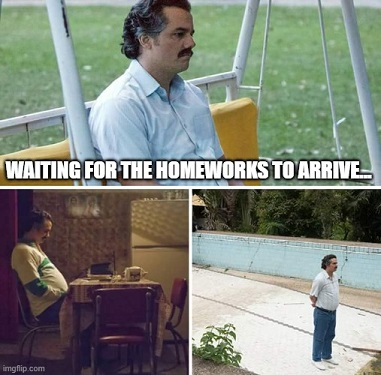